# Predicting Customer Response To Bank Marketing Campaigns Using Machine Learning 

In [1]:
from IPython.display import Image
Image(url='https://media.istockphoto.com/id/1405071007/photo/businessman-puts-a-indian-rupee-money-bag-on-scales-opposite-to-government-building-bank.jpg?s=612x612&w=is&k=20&c=E2otrfOr8gDhhTJosc3DVtRvi7hCY2n_CVnT5Ye6wPQ=')

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import psycopg2 as ps
import warnings 
warnings.simplefilter("ignore")
import plotly.express as px

In [3]:
data=pd.read_csv("C:\sem-2 (DSSA-22-24)\Datasets/bank.csv")
bank=data.copy()
bank

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11157,33,blue-collar,single,primary,no,1,yes,no,cellular,20,apr,257,1,-1,0,unknown,no
11158,39,services,married,secondary,no,733,no,no,unknown,16,jun,83,4,-1,0,unknown,no
11159,32,technician,single,secondary,no,29,no,no,cellular,19,aug,156,2,-1,0,unknown,no
11160,43,technician,married,secondary,no,0,no,yes,cellular,8,may,9,2,172,5,failure,no


In [4]:
bank.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes


In [6]:
bank.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
deposit      0
dtype: int64

In [5]:
bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11162 non-null  int64 
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(7), object(10)
memory usage: 1.4+ MB


In [6]:
print(bank.shape)
print(bank.size)

(11162, 17)
189754


In [7]:
bank.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'deposit'],
      dtype='object')

In [39]:
import pandas_profiling
pandas_profiling.ProfileReport(bank)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
bank.describe()

,age,balance,day,duration,campaign,pdays,previous
count,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000
mean,41.231948,1528.538524,15.658036,371.993818,2.508421,51.330407,0.832557
std,11.913369,3225.413326,8.420740,347.128386,2.722077,108.758282,2.292007
min,18.000000,-6847.000000,1.000000,2.000000,1.000000,-1.000000,0.000000
25%,32.000000,122.000000,8.000000,138.000000,1.000000,-1.000000,0.000000
50%,39.000000,550.000000,15.000000,255.000000,2.000000,-1.000000,0.000000
75%,49.000000,1708.000000,22.000000,496.000000,3.000000,20.750000,1.000000
max,95.000000,81204.000000,31.000000,3881.000000,63.000000,854.000000,58.000000


               age   balance       day  duration  campaign     pdays  previous
age       1.000000  0.112300 -0.000762  0.000189 -0.005278  0.002774  0.020169
balance   0.112300  1.000000  0.010467  0.022436 -0.013894  0.017411  0.030805
day      -0.000762  0.010467  1.000000 -0.018511  0.137007 -0.077232 -0.058981
duration  0.000189  0.022436 -0.018511  1.000000 -0.041557 -0.027392 -0.026716
campaign -0.005278 -0.013894  0.137007 -0.041557  1.000000 -0.102726 -0.049699
pdays     0.002774  0.017411 -0.077232 -0.027392 -0.102726  1.000000  0.507272
previous  0.020169  0.030805 -0.058981 -0.026716 -0.049699  0.507272  1.000000


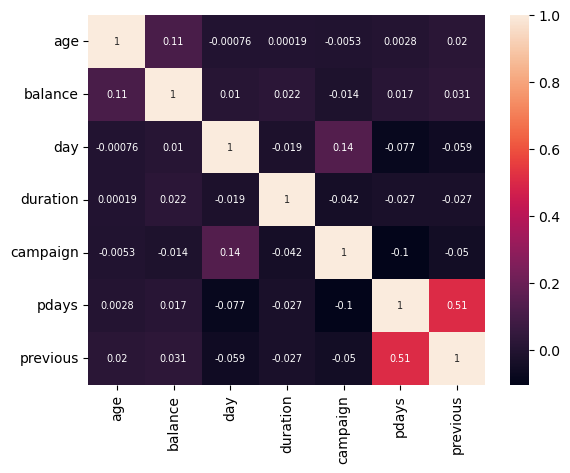

In [9]:
corr=bank.corr()
print(corr)
sns.heatmap(corr,annot=True,annot_kws={"size": 7})
plt.show()

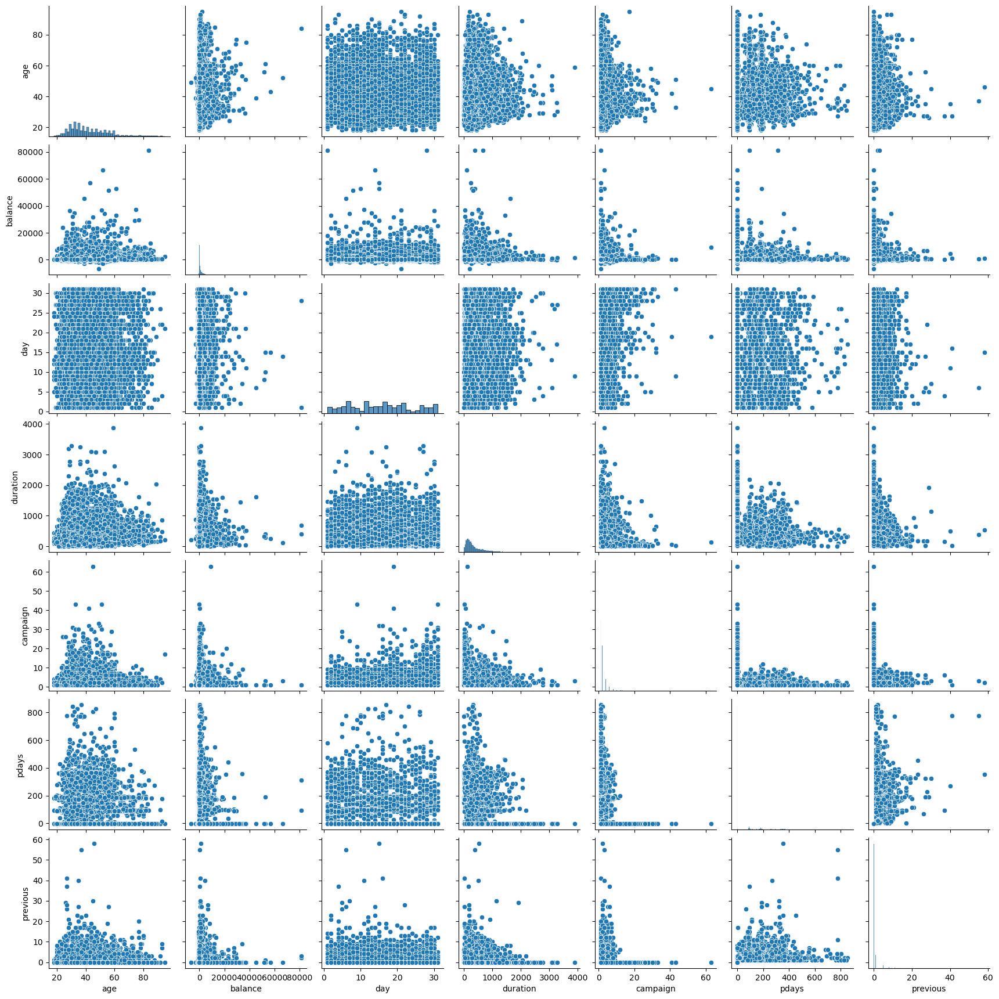

In [13]:
sns.pairplot(bank)
plt.show()

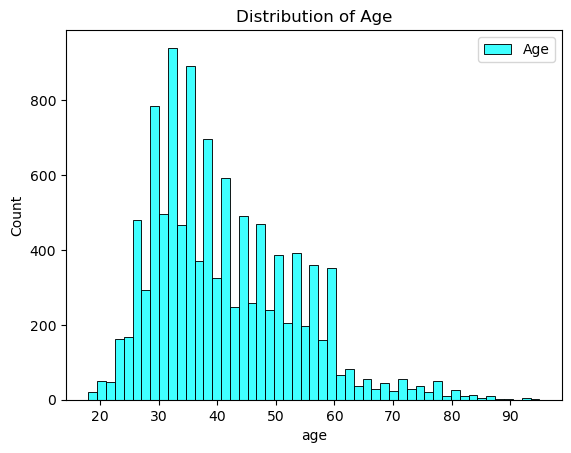

In [6]:
sns.histplot(x=bank['age'],color='cyan',label='Age')
plt.legend()
plt.title('Distribution of Age')
plt.show()

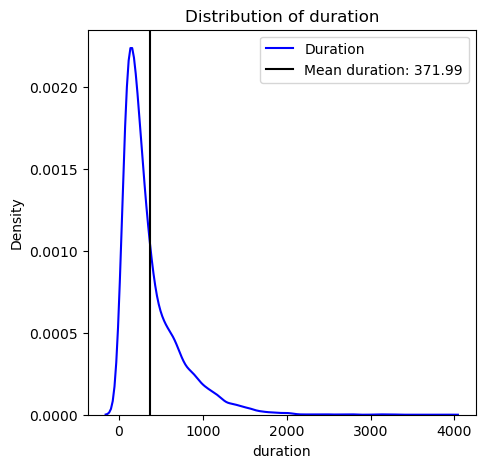

In [14]:
plt.figure(figsize=(5,5))
sns.kdeplot(x=bank['duration'],color='Blue',label='Duration')
plt.axvline(x=bank['duration'].mean(),color='k',label='Mean duration: {}'.format(round(bank['duration'].mean(),2)))
plt.legend()
plt.title('Distribution of duration')
plt.show()

In [10]:
fig=px.bar(bank.job.value_counts().reset_index().rename(columns={'index':'Job','job':'Count'}),x='Job',y='Count',color='Job')
fig.update_layout(title_text='Types ofCustomers jobs')

In [11]:
fig=px.box(bank,x='marital',y='age',color='marital',title='Distribution of age based on Marital Status',color_discrete_sequence=['Red','blue','Green'])
fig.update_layout(legend_title_text="Marital Status")
fig.show()

In [12]:
fig=px.bar(bank.education.value_counts().reset_index().rename(columns={'index':'Education','education':'Count'}),x='Education',y='Count',color='Education')
fig.update_layout(legend_title_text='Education',title_text='Education of the customers')
fig.show()


fig=px.box(bank,x='education',y='age',color='education',title='Distribution of age based on Education Level')
fig.update_layout(legend_title_text="Education Level")
fig.show()


In [13]:
bank['contact'].unique()

array(['unknown', 'cellular', 'telephone'], dtype=object)

In [14]:
bank['job'].unique()

array(['admin.', 'technician', 'services', 'management', 'retired',
       'blue-collar', 'unemployed', 'entrepreneur', 'housemaid',
       'unknown', 'self-employed', 'student'], dtype=object)

In [15]:
conn = ps.connect("dbname=students user=postgres password=souravk28")    #for connecting
cursor=conn.cursor()          #for cursor/operator connection
cursor.execute("DROP TABLE IF EXISTS bankdata")
cursor.execute("create table bankdata(age int,job text,marital text, education varchar, Defaultt text,balance int,housing text,loan text,contact text,day integer,month text,duration float,campaign int,pdays int,previous int,poutcome varchar,deposite text)");

for i in bank.index:
    vals=[bank.at[i,col] for col in list(bank.columns)]
    query="INSERT INTO bankdata values('%d','%s','%s','%s','%s','%d','%s','%s','%s','%d','%s','%d','%d','%d','%d','%s','%s')"%(vals[0],vals[1],vals[2],vals[3],vals[4],vals[5],vals[6],vals[7],vals[8],vals[9],vals[10],vals[11],vals[12],vals[13],vals[14],vals[15],vals[16])
    cursor.execute(query)

In [16]:
from sklearn.preprocessing import LabelEncoder

In [17]:
le = LabelEncoder()
bank['job']=le.fit_transform(bank['job'])
bank['marital']=le.fit_transform(bank['marital'])
bank['education']=le.fit_transform(bank['education'])
bank['housing']=le.fit_transform(bank['housing'])
bank['loan']=le.fit_transform(bank['loan'])
bank['contact']=le.fit_transform(bank['contact'])
bank['month']=le.fit_transform(bank['month'])
bank['poutcome']=le.fit_transform(bank['poutcome'])
bank['deposit']=le.fit_transform(bank['deposit'])
bank['default']=le.fit_transform(bank['default'])

In [18]:
bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   age        11162 non-null  int64
 1   job        11162 non-null  int32
 2   marital    11162 non-null  int32
 3   education  11162 non-null  int32
 4   default    11162 non-null  int32
 5   balance    11162 non-null  int64
 6   housing    11162 non-null  int32
 7   loan       11162 non-null  int32
 8   contact    11162 non-null  int32
 9   day        11162 non-null  int64
 10  month      11162 non-null  int32
 11  duration   11162 non-null  int64
 12  campaign   11162 non-null  int64
 13  pdays      11162 non-null  int64
 14  previous   11162 non-null  int64
 15  poutcome   11162 non-null  int32
 16  deposit    11162 non-null  int32
dtypes: int32(10), int64(7)
memory usage: 1.0 MB


In [19]:
bank.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,0,1,1,0,2343,1,0,2,5,8,1042,1,-1,0,3,1
1,56,0,1,1,0,45,0,0,2,5,8,1467,1,-1,0,3,1
2,41,9,1,1,0,1270,1,0,2,5,8,1389,1,-1,0,3,1
3,55,7,1,1,0,2476,1,0,2,5,8,579,1,-1,0,3,1
4,54,0,1,2,0,184,0,0,2,5,8,673,2,-1,0,3,1


In [20]:
bank.describe()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
count,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000
mean,41.231948,4.487905,1.199337,1.285164,0.015051,1528.538524,0.473123,0.130801,0.489697,15.658036,5.445709,371.993818,2.508421,51.330407,0.832557,2.477782,0.473840
std,11.913369,3.225132,0.625552,0.749478,0.121761,3225.413326,0.499299,0.337198,0.818724,8.420740,3.191939,347.128386,2.722077,108.758282,2.292007,1.002952,0.499338
min,18.000000,0.000000,0.000000,0.000000,0.000000,-6847.000000,0.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,-1.000000,0.000000,0.000000,0.000000
25%,32.000000,1.000000,1.000000,1.000000,0.000000,122.000000,0.000000,0.000000,0.000000,8.000000,3.000000,138.000000,1.000000,-1.000000,0.000000,2.000000,0.000000
50%,39.000000,4.000000,1.000000,1.000000,0.000000,550.000000,0.000000,0.000000,0.000000,15.000000,6.000000,255.000000,2.000000,-1.000000,0.000000,3.000000,0.000000
75%,49.000000,7.000000,2.000000,2.000000,0.000000,1708.000000,1.000000,0.000000,1.000000,22.000000,8.000000,496.000000,3.000000,20.750000,1.000000,3.000000,1.000000
max,95.000000,11.000000,2.000000,3.000000,1.000000,81204.000000,1.000000,1.000000,2.000000,31.000000,11.000000,3881.000000,63.000000,854.000000,58.000000,3.000000,1.000000


In [21]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score 
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

In [22]:
X = bank.drop('deposit', axis = 1)
y = bank['deposit']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(7813, 16)
(7813,)
(3349, 16)
(3349,)


In [23]:
print(X.columns)

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome'],
      dtype='object')


# Logistic Regression

In [24]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(random_state = 0)
classifier.fit(X_train, y_train)

LogisticRegression(random_state=0)

Training Accuracy :  76.37271214642263 %
Testing Accuracy :  74.76858763810093 %
[[1393  349]
 [ 496 1111]]


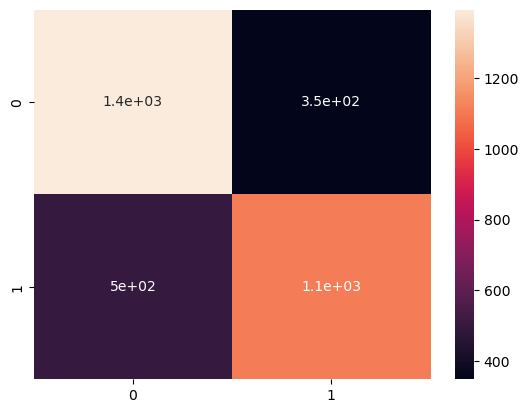

              precision    recall  f1-score   support

           0       0.74      0.80      0.77      1742
           1       0.76      0.69      0.72      1607

    accuracy                           0.75      3349
   macro avg       0.75      0.75      0.75      3349
weighted avg       0.75      0.75      0.75      3349



In [25]:
print("Training Accuracy : ",classifier.score(X_train,y_train)*100,"%")
print("Testing Accuracy : ",classifier.score(X_test,y_test)*100,"%")
ypredict=classifier.predict(X_test)
cm=confusion_matrix(y_true=y_test,y_pred=ypredict)
print(cm)
sns.heatmap(cm,annot=True)
plt.show()
print(classification_report(y_test,ypredict))

In [26]:
TN=cm[0,0]
FP=cm[0,1]
FN=cm[1,0]
TP=cm[1,1]
TN,FP,FN,TP

(1393, 349, 496, 1111)

# Decision Tree

In [27]:
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier(random_state = 0)
classifier.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

Training Accuracy :  100.0 %
Testing Accuracy :  78.05315019408778 %
[[1379  363]
 [ 372 1235]]


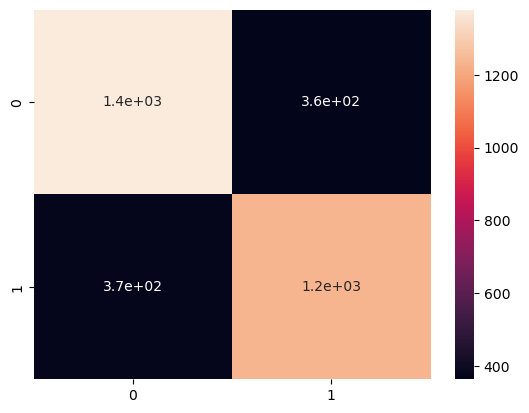

              precision    recall  f1-score   support

           0       0.79      0.79      0.79      1742
           1       0.77      0.77      0.77      1607

    accuracy                           0.78      3349
   macro avg       0.78      0.78      0.78      3349
weighted avg       0.78      0.78      0.78      3349



In [28]:
print("Training Accuracy : ",classifier.score(X_train,y_train)*100,"%")
print("Testing Accuracy : ",classifier.score(X_test,y_test)*100,"%")
ypredict=classifier.predict(X_test)
cm=confusion_matrix(y_true=y_test,y_pred=ypredict)
print(cm)
sns.heatmap(cm,annot=True)
plt.show()
print(classification_report(y_test,ypredict))

# Random Forest

In [29]:
from sklearn.ensemble import RandomForestClassifier
RF =RandomForestClassifier(random_state=32)
RF.fit(X_train,y_train)

RandomForestClassifier(random_state=32)

Training Accuracy :  100.0 %
Testing Accuracy :  84.02508211406389 %
[[1425  317]
 [ 218 1389]]


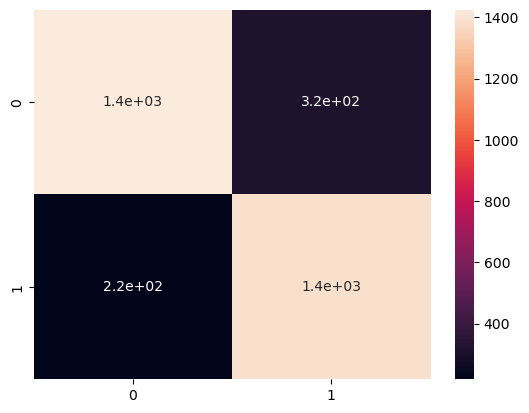

              precision    recall  f1-score   support

           0       0.87      0.82      0.84      1742
           1       0.81      0.86      0.84      1607

    accuracy                           0.84      3349
   macro avg       0.84      0.84      0.84      3349
weighted avg       0.84      0.84      0.84      3349



In [30]:
print("Training Accuracy : ",RF.score(X_train,y_train)*100,"%")
print("Testing Accuracy : ",RF.score(X_test,y_test)*100,"%")
ypredict=RF.predict(X_test)
cm=confusion_matrix(y_true=y_test,y_pred=ypredict)
print(cm)
sns.heatmap(cm,annot=True)
plt.show()
print(classification_report(y_test,ypredict))

# Support Vector Machine

In [31]:
from sklearn.svm import SVC
svc = SVC()
svc.fit(X_train,y_train)

SVC()

Training Accuracy :  74.03046205042877 %
Testing Accuracy :  73.4249029561063 %
[[1433  309]
 [ 581 1026]]


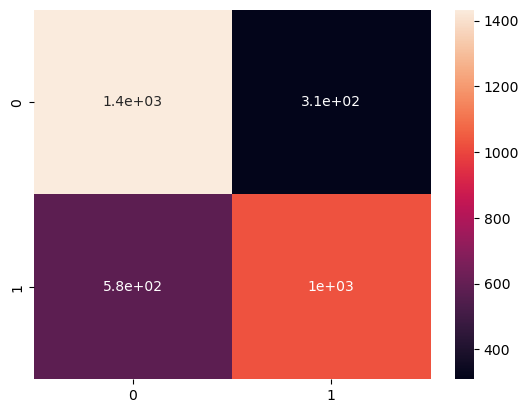

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      1742
           1       0.77      0.64      0.70      1607

    accuracy                           0.73      3349
   macro avg       0.74      0.73      0.73      3349
weighted avg       0.74      0.73      0.73      3349



In [32]:
print("Training Accuracy : ",svc.score(X_train,y_train)*100,"%")
print("Testing Accuracy : ",svc.score(X_test,y_test)*100,"%")

ypredict=svc.predict(X_test)
cm=confusion_matrix(y_true=y_test,y_pred=ypredict)
print(cm)
sns.heatmap(cm,annot=True)
plt.show()
print(classification_report(y_test,ypredict))

# KNN Classifier

In [33]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train,y_train)

KNeighborsClassifier()

Training Accuracy :  81.96595417893255 %
Testing Accuracy :  74.41027172290235 %
[[1330  412]
 [ 445 1162]]


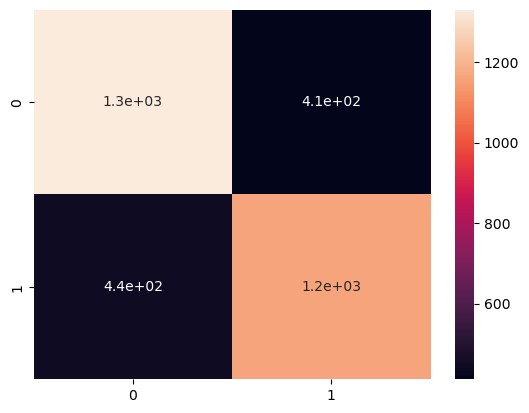

              precision    recall  f1-score   support

           0       0.75      0.76      0.76      1742
           1       0.74      0.72      0.73      1607

    accuracy                           0.74      3349
   macro avg       0.74      0.74      0.74      3349
weighted avg       0.74      0.74      0.74      3349



In [34]:
print("Training Accuracy : ",knn.score(X_train,y_train)*100,"%")
print("Testing Accuracy : ",knn.score(X_test,y_test)*100,"%")
ypredict=knn.predict(X_test)
cm=confusion_matrix(y_true=y_test,y_pred=ypredict)
print(cm)
sns.heatmap(cm,annot=True)
plt.show()
print(classification_report(y_test,ypredict))

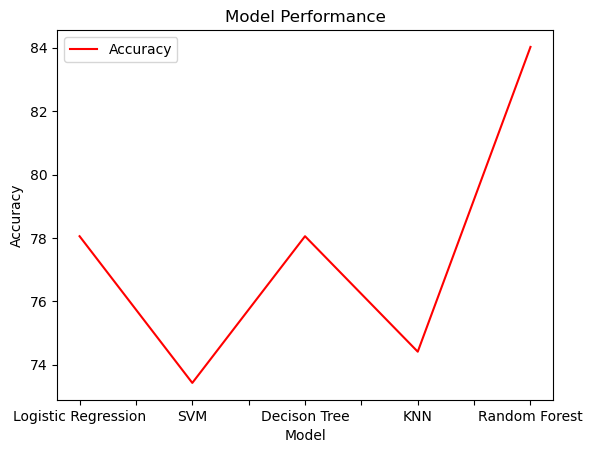

In [35]:
# Define the performance metrics for three models
performance = {'Logistic Regression':78.05315019408778 , 'SVM': 73.4249029561063 , 'Decison Tree': 78.05315019408778 ,'KNN':74.41027172290235,'Random Forest':84.02508211406389}

# Create a pandas dataframe from the performance metrics
df = pd.DataFrame.from_dict(performance, orient='index', columns=['Accuracy'])

# Plot the accuracy of the three models using a line plot
ax = df.plot(kind='line', title='Model Performance', xlabel='Model', ylabel='Accuracy', color='red')

# Display the plot
plt.show()

In [36]:

fig=px.pie(bank.groupby(['deposit'],as_index=False)['age'].count().rename(columns={'age':'Count'}),names='deposit',values='Count',template='ggplot2',hole=0.6)
fig.update_traces(marker=dict(line=dict(color='#000000', width=1.4)))
fig.update_layout(title_x=0.5,showlegend=True,legend_title_text='<b>Deposit')
fig.update_traces(textposition='outside', textinfo='percent+label')
fig.update_layout(title_x=0.5,title_text='<b>Term Deposits',font_family="Times New Roman",title_font_family="Times New Roman")
fig.show()

In [37]:
fig=px.box(bank,x='deposit',y='duration',color='deposit',color_discrete_sequence=['red','blue'],title='Effect of Duration on Term Deposit Status')
fig.update_layout(legend_title_text="Term Deposit")
fig.show()

In [38]:

a=bank.groupby(['job','deposit'],as_index=False)['age'].count().rename(columns={'age':'Count'})
a['percent']=round(a['Count']*100/a.groupby('job')['Count'].transform('sum'),1)
a['percent']=a['percent'].apply(lambda x: '{}%'.format(x))
fig=px.bar(a,x='job',y='Count',text='percent',color='deposit',barmode='group',template='simple_white',color_discrete_sequence=['MediumPurple','YellowGreen'])
fig.update_traces(marker=dict(line=dict(color='#000000', width=1)),textposition = "outside")
fig.update_layout(title_x=0.5,template='simple_white',showlegend=True,title_text='<b style="color:black; font-size:105%;">Term Depositors based on Job Type</b>',font_family="Times New Roman",title_font_family="Times New Roman")
fig.show()